In [1]:
#hide
from utils import *
hc(
    "Parsing Rhythmic Struture from Song",
    ["S-trasform", "Tempogram"],
    [("On Musical Onset Detection via the S-Transform, Silva et. al.", "https://arxiv.org/pdf/1712.02567")]
)

# Objective

- Given a music signal, the task is to compute the underlying rhythmic structure.

<p style="
  display: inline-block;
  background: #fef9c3;
  color: #7a6400;
  border-left: 5px solid #facc15;
  border-radius: 6px;
  padding: 0.5rem 1rem;
  font-weight: 500;
  box-shadow: 0 1px 4px rgba(0,0,0,0.08);
  margin-right: 1rem;
">
  <strong>Status:</strong> In Progress
</p>

<p style="
  display: inline-block;
  background: #e0f2fe;
  color: #075985;
  border-left: 5px solid #38bdf8;
  border-radius: 6px;
  padding: 0.5rem 1rem;
  font-weight: 500;
  box-shadow: 0 1px 4px rgba(0,0,0,0.08);
">
  👥 <strong>Contributors:</strong> Ankit Anand,
</p>

# Rhythmic Structure Representation

To simplify the problem without lossing its applicability, we represent rhythmic structure with three components:
1. Kick
2. Snare
3. High hats

Given a music signal $y \in \mathbb{R}^N$, its rhythmic structure can be represented by $R \in \mathbb{R}^{3 \times N}$ with each element being an activity measure $\in [0, 1]$ for each component. We need to find $R$ given $x$.

# Onset Detection

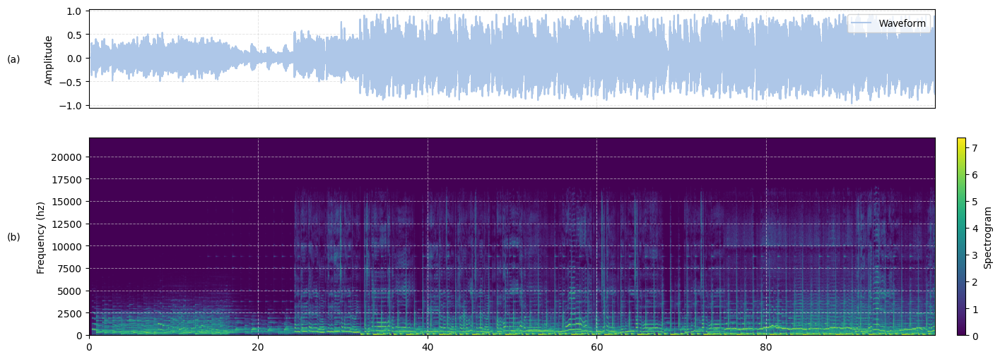

In [1]:
import modusa as ms
import numpy as np

# Load an example song
y, sr, title = ms.load.audio("../../datasets/songs_liked/Alka Yagnik, Arijit Singh - Agar Tum Saath Ho (From 'Tamasha').mp3", trim=(0, 100), ch=1, sr=44100)

# Spectrogram
WIN_LEN, HOP_LEN = 1024, 441
X, Xt, Xf = ms.extract.stft(y, sr, winlen=WIN_LEN, hoplen=HOP_LEN)
Y, Yf, Yt = ms.extract.stft(y, sr, winlen=WIN_LEN, hoplen=HOP_LEN, gamma=10)

# Visualization
c = ms.canvas.tiers("sm")
c.paint.signal(y, np.arange(y.size) / sr, label="Waveform", ylabel="Amplitude")
c.paint.image(*ms.extract.stft(y, sr, winlen=1024, hoplen=480, gamma=10), label="Spectrogram", ylabel="Frequency (hz)", o="lower")
# cnv.paint.callouts((2.75, 2000), labels="An onset", text_offset=(1.5, 2000))
c.legend(inside_tile=True)

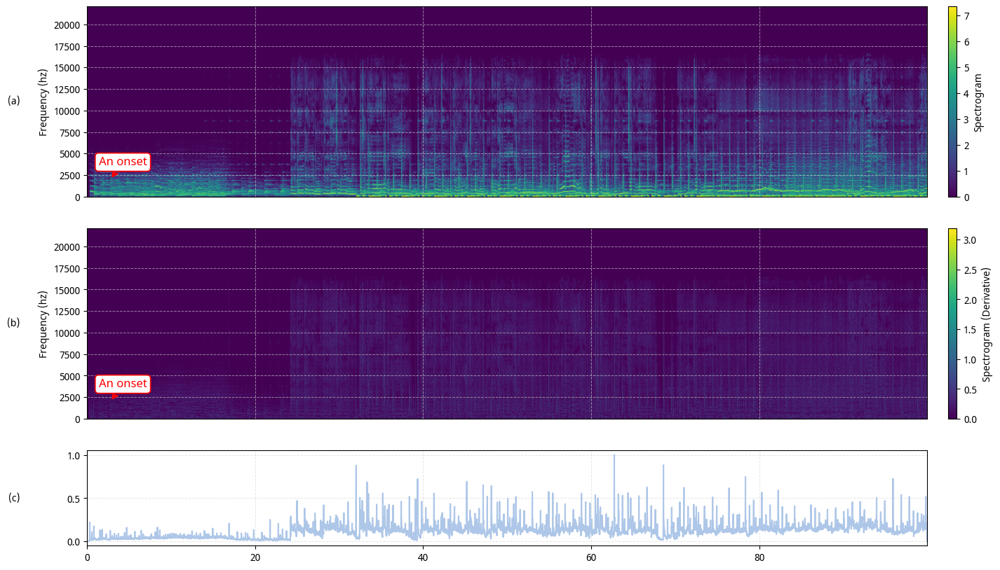

In [2]:
#---------------------------
# Compute spectrum-based 
# ODF
#---------------------------

# First derivative
Ydiff1 = np.zeros_like(Y)
Ydiff1[:,:-1] = np.diff(Y)
Ydiff1[Ydiff1 < 0] = 0.0

# Second derivative
Ydiff2 = np.zeros_like(Y)
Ydiff2[:,:-1] = np.diff(Ydiff1)
Ydiff2[Ydiff2 < 0] = 0.0

# Third derivative
Ydiff3 = np.zeros_like(Y)
Ydiff3[:,:-1] = np.diff(Ydiff2)
Ydiff3[Ydiff3 < 0] = 0.0

Ydiff = 0.6 * Ydiff1 + 0.3 * Ydiff2 + 0.1 * Ydiff3 # Linear combination of derivative

nov = np.sum(Ydiff, axis=0)
nov_sr = int(sr / HOP_LEN)
nov /= np.max(nov)

# Visualization
c = ms.canvas.tiers("mms")

c.paint.image(Y, Yf, Yt, label="Spectrogram", ylabel="Frequency (hz)", o="lower")
c.paint.callouts((2.75, 2000), labels="An onset", text_offset=(1.5, 2000))

c.paint.image(Ydiff, Yf, Yt, label="Spectrogram (Derivative)", ylabel="Frequency (hz)", o="lower")
c.paint.callouts((2.75, 2000), labels="An onset", text_offset=(1.5, 2000))

c.paint.signal(nov, np.arange(nov.size) / nov_sr, label="ODF")

In [3]:
from scipy.signal import find_peaks

beat_pos_mask = np.zeros(Y.shape[1]) # Probability mask for timestamps with beat positions

peaks, props = find_peaks(nov, prominence=0.3, distance=10)
proms = props['prominences']

In [4]:
onsets = peaks / nov_sr

In [5]:
y_onsets, _ = ms.synthesize.onsets(onsets, sr, size=y.size, strengths=None)


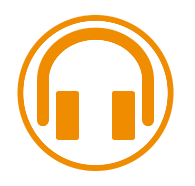

In [6]:
ms.play.audio(0.4 * y + y_onsets, sr)

In [11]:

# Visualization
c = ms.canvas.tiers("sm", annotate=True)
c.paint.signal(y, np.arange(y.size) / sr, label="Waveform", ylabel="Amplitude")
c.paint.image(*ms.extract.stft(y, sr, winlen=1024, hoplen=480, gamma=10), label="Spectrogram", ylabel="Frequency (hz)", o="lower", ylim=(0, 4000))
# cnv.paint.callouts((2.75, 2000), labels="An onset", text_offset=(1.5, 2000))
c.legend(inside_tile=True)

# Introduction

A beat/onset is sudden burst of energy occuring at regular time intervals, allowing us to anticipate, and tap along with the music.

Another metric that can be derived from beat location is *Tempo*. A tempo is the rate at which beats occur over a given period. It is measured in *beats per minute (BPM)*. For example, a tempo of 120 BPM means one beat occurs every 0.5 seconds.

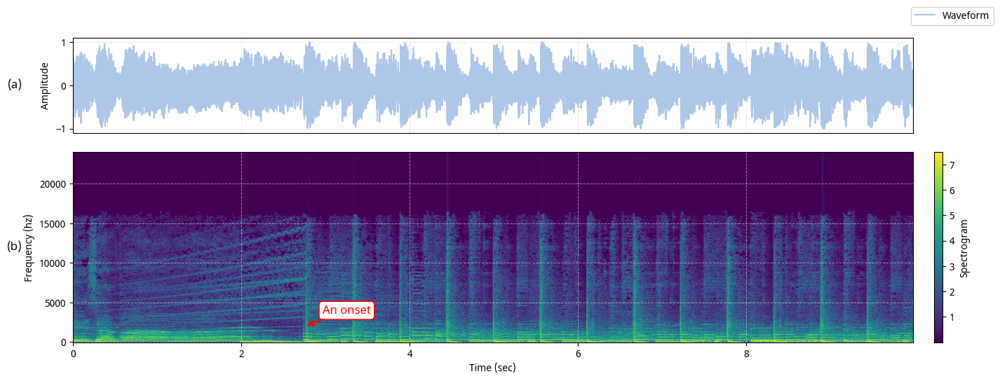

In [493]:
#hide
import modusa as ms
y, sr, title = ms.load("../../data/sample_songs/1.mp3", trim=(60, 70), ch=1)
fig = ms.fig("sm", abc=True)
fig.add_signal(y, np.arange(y.size) / sr, label="Waveform", ylabel="Amplitude")
fig.add_matrix(*ms.stft(y, sr, winlen=1024, hoplen=480, gamma=10), label="Spectrogram", ylabel="Frequency (hz)", o="lower")
fig.add_arrows((2.75, 2000), labels="An onset", text_offset=(0.5, 2000))
fig.add_legend(0.92)
fig.add_xlabel("Time (sec)")

(a) is the waveform of a song; (b) shows the onsets or beats as vertical lines. One of them are labelled as "An onset"

# Dataset

Before implementing the algorithm, I would like to prepare the dataset for testing.

I have a collection of 25 popular hindi songs for which the beat locations and global tempo is labelled by me. I will split them into 30 second chunks giving us roughly 150 chunks.

In [10]:
def test_beat_tracking():
    """
    """

def test_tempo_estimate():
    pass

# Appendix

# S-Transform based BT

This algorithm is inspired by [1] that uses a feature representation known as the *S-Transform* for beat tracking.

## Implementation

In [2]:
import modusa as ms
import numpy as np
from stockwell import st
from scipy.signal import find_peaks
from scipy.interpolate import CubicSpline

SR = 44100 # Hz

#--------------------------------
# Load an audio signal
#--------------------------------
audio_fp = "../../data/sample_songs/1.mp3"
x, sr, title = ms.load(audio_fp, sr=SR, trim=(60, 70), ch=1)

#--------------------------------
# Downsample
#--------------------------------
D = 40 # Downsampling factor => sr = 1102.5 hz

y = x[::D]
sr = sr // D

#--------------------------------
# Compute the S-Transform
#--------------------------------
F = st.st(y, lo=0, hi=int(y.size/2)) # shape = (y.size / 2, y.size): S-Transform using the library
S = np.abs(F) # p X n
p = np.linspace(0, sr / 2, F.shape[0])
n = np.arange(F.shape[1]) / sr

#---------------------------------------
# Band splitting
# S (freq X time) -> (band X freq X time)
#---------------------------------------
K = 200 # Subband size 200 bins ~ 50 hz

S = S[:S.shape[0] - S.shape[0] % K, :] # Remove rows that don't fit into complete K-sized bands
S = S.reshape(-1, K, S.shape[1]) # (band, freq, time)

#----------------------------------------------
# Compute onset envelope per band
#----------------------------------------------
ri = np.mean(S, axis=1) # Note here axis = 1 => freq bin
ri = ri / np.max(np.abs(ri), axis=1, keepdims=True) # Normalization

## Computing the peak envelope joining the peaks of onset envelope using cubic spline intepolation
d = 1 # 1 sample
ui = np.zeros_like(ri)

for band in range(ri.shape[0]): # For each of the bands
    peaks, _ = find_peaks(ri[band], distance=d)

    peak_indices = peaks
    peak_values = ri[band][peak_indices]

    cs = CubicSpline(peak_indices, peak_values)
    ui[band] = cs(np.arange(len(ri[band])))

    if band == 0:
        peak_indices_band_0 = peak_indices # Storing this for showing an example

## Offset the onset envelope with the mean of the peak envelope and half-rectify (Values less than 0 is set to 0)
ri = np.maximum(ri - np.mean(ui, axis=1, keepdims=True), 0)

#-----------------------------------------------
# Clustering the peaks using multiple thresholds
#-----------------------------------------------

## We find thresholds for each band by dividing the [0, max of the band value] into H threshold values
## This is a little different from the paper where they divide into H segments not H values.
H = 10

# We use numpy broadcasting for this
max_vals = np.max(ri, axis=1, keepdims=True)
fractions = np.linspace(0, 1, H)[None, :]
lij = max_vals * fractions   # shape (band, threshold)

# Finding all the time indices where ri >= lij
Iij = np.empty((lij.shape[0], lij.shape[1]), dtype=object) # object type is chosen to allow differnt-sized array in the mix
for i in range(lij.shape[0]):
    for j in range(lij.shape[1]):
        Iij[i,j] = np.where(ri[i, :] >= lij[i, j])[0] 

## Forming cluster and assigning them one value per cluster (mean of the indices) and then finding the difference between consecutive clusters mean (cij)
cij = np.empty_like(Iij, dtype=object)
vij = np.empty((Iij.shape[0], Iij.shape[1]), dtype=np.float32)

# Helper function
def get_consecutive_clusters(*args):
    """
    Given a 1D array of indices, return a list of consecutive clusters.

    For ex. [1, 2, 3, 7, 8, 9, 15, 17, 18] -> [[1, 2, 3], [7, 8, 9], [15], [17, 18]]
    """
    arr = args[0]
    
    if len(arr) == 0: return []
    
    clusters = []
    cluster = [arr[0]] # First cluster
    
    for x in arr[1:]:
        if x == cluster[-1] + 1: # Add element to the last cluster
            cluster.append(x)
        else: # Form new cluster
            clusters.append(np.array(cluster))
            cluster = [x]
    clusters.append(np.array(cluster))
    
    return clusters

for i in range(lij.shape[0]):
    for j in range(lij.shape[1]):
        Iij[i, j] = [np.mean(cluster) for cluster in get_consecutive_clusters(Iij[i, j])]
        cij[i, j] = np.diff(Iij[i, j])
        
        if cij[i, j].size < 5:
            vij[i, j] = 0.0
        else:
            vij[i, j] = np.sum(cij[i, j]) / np.linalg.norm(cij[i, j], ord=2) * (1 / np.sqrt(cij[i, j].size))

#-------------------------------------
# Find the (i, j) that maximizes the
# vij (a measure of confidence in the
# detected beats)
# Note that in the paper, the authors
# selects i not (i, j)
#-------------------------------------
i_star, j_star = np.unravel_index(np.argmax(vij), vij.shape)
confidence = np.max(vij)

# Raising error if the confidence is not high
# enough
eps = 0.2
if (1 - confidence) > eps:
    raise RuntimeError(f"IsolationFailure: Confidence {confidence:.4f} is too low")

## Getting beats in sec and tempo in BPM
beats = np.array(Iij[i_star, j_star]) / sr

def most_common(arr, tol=5):
    """
    
    """
    from collections import Counter
    
    tolerance = 5  # define your range
    # Group numbers by rounding based on the tolerance
    binned = [round(x / tolerance) * tolerance for x in arr]
    # Count occurrences
    counts = Counter(binned)
    # Find the most common bin
    most_common_bin, frequency = counts.most_common(1)[0]

    return most_common_bin

tempo = (60 * sr) / most_common(np.array(cij[i_star, j_star]))

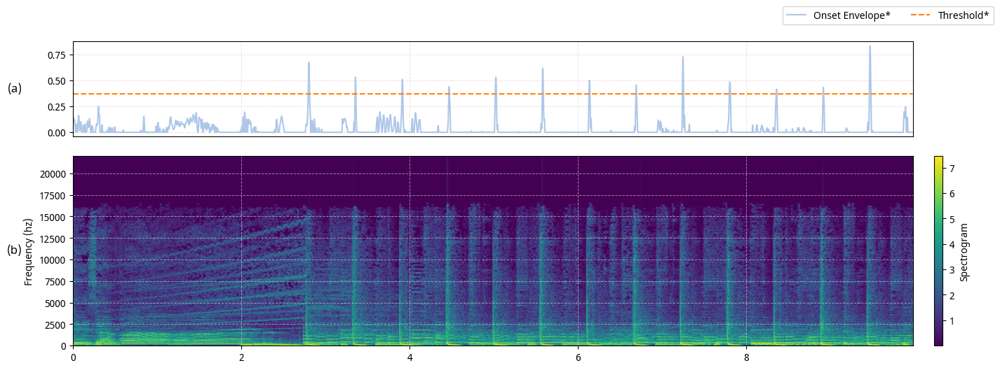

In [9]:
fig = ms.fig("sm", abc=True)
fig.add_signal(ri[i_star], np.arange(ri[i_star].size) / sr, label="Onset Envelope*")
fig.add_signal(np.ones(ri[i_star].size) * lij[i_star, j_star], np.arange(ri[i_star].size) / sr, ax=1, ls="--", label="Threshold*")
fig.add_matrix(*ms.stft(x, SR, winlen=1024, hoplen=480, gamma=10), label="Spectrogram", ylabel="Frequency (hz)", o="lower")
fig.add_legend(0.93)

ticks = np.array(Iij[i_star, j_star]) / sr
ticks, SR = ms.synth_clicks(ticks, SR, nharm=20)
# ms.play(0.2*x[:len(ticks)] + ticks, SR)

(a) is the onset envelope for band $i*$ and the dotted orange line corresponds to threshold $j*$. \
On comparing the selected peaks from (a) and the vertical lines from spectrogram (b), we see that the algorithm detected the beat positions correctly.

## Testing

For testing the algorithm, I have 25 popular songs in my collection for which the tempo is labelled by me.

In [12]:
#hide
# Wrapper Function
def beat_detection(x, sr, D=40, K=200, H=10):
    """
    An S-Transform based beat and tempo
    detector algorithm based on 
    https://arxiv.org/pdf/1712.02567

    Parameters
    ----------
    x: ndarray
        - Music Signal for which the beats need to be computed.
    sr: int
        - Sampling rate to load the signal.
        - Default: None
    D: int
        - Downsampling factor.
    K: int
        - Number of bins per frequency band while performing band splitting.
    H: int
        - Number of thresholds to be included.

    Returns
    -------
    ndarray:
        - Beat locations in sec.
    float:
        - Tempo of the music signal
    """
    import modusa as ms
    import numpy as np
    from stockwell import st
    from scipy.signal import find_peaks
    from scipy.interpolate import CubicSpline
    
    #--------------------------------
    # Downsample
    #--------------------------------    
    y = x[::D]
    sr = sr // D
    
    #--------------------------------
    # Compute the S-Transform
    #--------------------------------
    F = st.st(y, lo=0, hi=int(y.size/2)) # shape = (y.size / 2, y.size): S-Transform using the library
    S = np.abs(F) # p X n
    p = np.linspace(0, sr / 2, F.shape[0])
    n = np.arange(F.shape[1]) / sr
    
    #---------------------------------------
    # Band splitting
    # S (freq X time) -> (band X freq X time)
    #---------------------------------------
    
    S = S[:S.shape[0] - S.shape[0] % K, :] # Remove rows that don't fit into complete K-sized bands
    S = S.reshape(-1, K, S.shape[1]) # (band, freq, time)
    
    #----------------------------------------------
    # Compute onset envelope per band
    #----------------------------------------------
    ri = np.mean(S, axis=1) # Note here axis = 1 => freq bin
    ri = ri / np.max(np.abs(ri), axis=1, keepdims=True) # Normalization
    
    ## Computing the peak envelope joining the peaks of onset envelope using cubic spline intepolation
    d = 1 # 1 sample
    ui = np.zeros_like(ri)
    
    for band in range(ri.shape[0]): # For each of the bands
        peaks, _ = find_peaks(ri[band], distance=d)
    
        peak_indices = peaks
        peak_values = ri[band][peak_indices]
    
        cs = CubicSpline(peak_indices, peak_values)
        ui[band] = cs(np.arange(len(ri[band])))
    
        if band == 0:
            peak_indices_band_0 = peak_indices # Storing this for showing an example
    
    ## Offset the onset envelope with the mean of the peak envelope and half-rectify (Values less than 0 is set to 0)
    ri = np.maximum(ri - np.mean(ui, axis=1, keepdims=True), 0)
    
    #-----------------------------------------------
    # Clustering the peaks using multiple thresholds
    #-----------------------------------------------
    
    ## We find thresholds for each band by dividing the [0, max of the band value] into H threshold values
    ## This is a little different from the paper where they divide into H segments not H values.
    
    # We use numpy broadcasting for this
    max_vals = np.max(ri, axis=1, keepdims=True)
    fractions = np.linspace(0, 1, H)[None, :]
    lij = max_vals * fractions   # shape (band, threshold)
    
    # Finding all the time indices where ri >= lij
    Iij = np.empty((lij.shape[0], lij.shape[1]), dtype=object) # object type is chosen to allow differnt-sized array in the mix
    for i in range(lij.shape[0]):
        for j in range(lij.shape[1]):
            Iij[i,j] = np.where(ri[i, :] >= lij[i, j])[0] 
    
    ## Forming cluster and assigning them one value per cluster (mean of the indices) and then finding the difference between consecutive clusters mean (cij)
    cij = np.empty_like(Iij, dtype=object)
    vij = np.empty((Iij.shape[0], Iij.shape[1]), dtype=np.float32)
    
    # Helper function
    def get_consecutive_clusters(*args):
        """
        Given a 1D array of indices, return a list of consecutive clusters.
    
        For ex. [1, 2, 3, 7, 8, 9, 15, 17, 18] -> [[1, 2, 3], [7, 8, 9], [15], [17, 18]]
        """
        arr = args[0]
        
        if len(arr) == 0: return []
        
        clusters = []
        cluster = [arr[0]] # First cluster
        
        for x in arr[1:]:
            if x == cluster[-1] + 1: # Add element to the last cluster
                cluster.append(x)
            else: # Form new cluster
                clusters.append(np.array(cluster))
                cluster = [x]
        clusters.append(np.array(cluster))
        
        return clusters
    
    for i in range(lij.shape[0]):
        for j in range(lij.shape[1]):
            Iij[i, j] = [np.mean(cluster) for cluster in get_consecutive_clusters(Iij[i, j])]
            cij[i, j] = np.diff(Iij[i, j])
            
            if cij[i, j].size < 5:
                vij[i, j] = 0.0
            else:
                vij[i, j] = np.sum(cij[i, j]) / np.linalg.norm(cij[i, j], ord=2) * (1 / np.sqrt(cij[i, j].size))
    
    #-------------------------------------
    # Find the (i, j) that maximizes the
    # vij (a measure of confidence in the
    # detected beats)
    # Note that in the paper, the authors
    # selects i not (i, j)
    #-------------------------------------
    i_star, j_star = np.unravel_index(np.argmax(vij), vij.shape)
    confidence = np.max(vij)
    
    # Raising error if the confidence is not high
    # enough
    eps = 0.2
    if (1 - confidence) > eps:
        raise RuntimeError(f"IsolationFailure: Confidence {confidence:.4f} is too low")

    ## Getting beats and tempo
    beats = np.array(Iij[i_star, j_star]) / sr
    
    def most_common(arr, tol=5):
        """
        
        """
        from collections import Counter
        
        tolerance = 5  # define your range
        # Group numbers by rounding based on the tolerance
        binned = [round(x / tolerance) * tolerance for x in arr]
        # Count occurrences
        counts = Counter(binned)
        # Find the most common bin
        most_common_bin, frequency = counts.most_common(1)[0]
    
        return most_common_bin
    
    tempo = (60 * sr) / most_common(np.array(cij[i_star, j_star]))

    return beats, tempo

In [416]:
import pandas as pd
from pathlib import Path
from tqdm import tqdm

dataset_df = pd.read_csv("../../data/songs_labelled/label_data.csv")
dataset_df = dataset_df[['Filename', 'Tempo (BPM)']]

In [453]:
# Running the test
base_audio_dir = Path("../../data/songs_labelled/")
for i, row in tqdm(dataset_df.iterrows()):
    fn = row['Filename']
    fp = base_audio_dir / fn # File path

    # Load music signal
    y, sr, title = ms.load(fp, sr=SR, trim=(30, 50), ch=1)
    try:
        beats, tempo = beat_detection(y, sr)
        dataset_df.loc[i, 'Detected Tempo (BPM)'] = int(tempo)
    except RuntimeError as e:
        pass

25it [01:04,  2.59s/it]


In [455]:
dataset_df.loc[:, 'Filename'] = "****"
dataset_df

,Filename,Tempo (BPM),Detected Tempo (BPM)
0,****,83,20.0
1,****,84,13.0
2,****,95,696.0
3,****,140,275.0
4,****,120,80.0
5,****,95,16.0
6,****,103,101.0
7,****,113,44.0
8,****,90,22.0
9,****,120,29.0


## Conclusion

1. The implementation of the algorithm does not perform well on my labelled dataset.
2. The impementation is computationally expensive due to so many nested for loops that I can't figure out a way to avoid.
3. To mitigate 2, I have to use smaller clips from the song (10 to 20 seconds) which seems to be a limitation of the algorithm.
4. The "ballroom" dataset that the authors used to report their algorithm performance is something that needs to be looked as it might be biased with presence of strong percussive element throughtout which is not true for popular music

# Tempogram based BT

This algorithm is inspired by []

## Implementation

In [166]:
import modusa as ms
import numpy as np
from scipy.signal import find_peaks

#---------------------------
# Load the music signal
#---------------------------
SR = 44100 # hz
audio_fp = "../../data/sample_songs/1.mp3"
y, sr, title = ms.load(audio_fp, sr=SR, trim=(60, 70), ch=1)

#---------------------------
# Compute spectrum-based 
# novelty function
#---------------------------
WIN_LEN, HOP_LEN = 1024, 441
Y, Yf, Yt = ms.stft(y, sr, winlen=WIN_LEN, hoplen=HOP_LEN, gamma=10)
Ydiff = np.zeros((Y.shape[0], Y.shape[1]))
Ydiff[:,:-1] = np.diff(Y)
Ydiff[Ydiff < 0] = 0.0

nov = np.sum(Ydiff, axis=0)
nov_sr = int(sr / HOP_LEN)

## Smooth out novelty function using cubic spine on the peaks
peaks, _ = find_peaks(nov, prominence=0.2, distance=1)

peak_indices = peaks
peak_values = nov[peak_indices]

cs = CubicSpline(peak_indices, peak_values)
u = cs(np.arange(nov.size))
nov = np.maximum(nov - np.mean(u), 0)
nov /= np.max(nov)

#------------------------------
# Compute autocorrelation 
# based Tempogram
#------------------------------


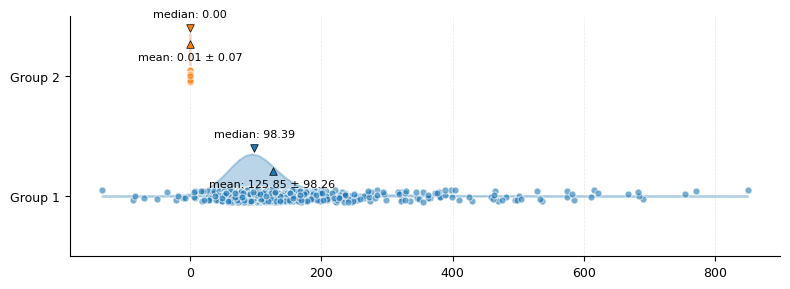

In [155]:
ms.hill_plot(u, nov)

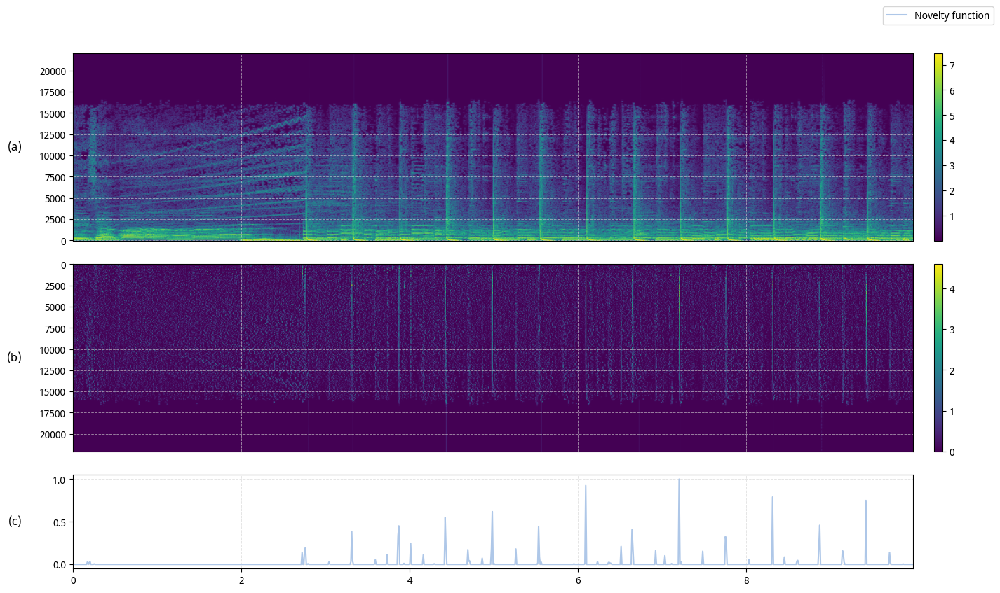

In [168]:
fig = ms.fig("mms", abc=True)
fig.add_matrix(Y, Yf, Yt, o="lower")
fig.add_matrix(Ydiff, Yf, Yt)
fig.add_signal(nov, np.arange(nov.size) / nov_sr, label="Novelty function")
# fig.add_signal(u, nov_t, label="Upper Envelope", ax=3, ylim=(-5, 5))
fig.add_legend(0.92)